# The Blue Sky Challenge  
 **Team**

 **PYPI_PLAYERS**

 **Teammates**

- Owais Ahmad [PortFolio](https://owaiskhan9654.github.io/)

- Ahmad Mujtaba [PortFolio](https://www.linkedin.com/in/ahmad-mujtaba-4198b31b8/)







**Refrences**

- K. Thiyagarajan, S. Kodagoda, L. Van Nguyen and R. Ranasinghe, "Sensor Failure Detection and Faulty Data Accommodation Approach for Instrumented Wastewater Infrastructures," in IEEE Access, vol. 6, pp. 56562-56574, 2018, 
doi: [10.1109/ACCESS.2018.2872506](https://ieeexplore.ieee.org/document/8476572).

- A Python interface for the netCDF4 file-format that reads and writes local or remote HDF5 files directly via h5py or h5pyd, without relying on the Unidata netCDF library. https://github.com/h5netcdf/h5netcdf

- **Disclaimer** This Code is not Complete Solution for this task but we tried out best to do feature extraction and extract Regression model out of that. There are 2 parts of our proposed solution.

### Part - 1

## Import Libraries

In [1]:
import json
from netCDF4 import Dataset
import numpy as np
import netCDF4 as nc4

from sentinelsat import SentinelAPI, geojson_to_wkt


from tqdm import tqdm
import matplotlib.pyplot as plt
import netCDF4
import glob
from mpl_toolkits.basemap import Basemap

In [2]:
nc_file = 'K:\\Blue Sky Challenge\\BlueSkyChallenge-main\\data\\L2\\S5P_OFFL_L2__NO2____20210325T104955_20210325T123125_17863_01_010400_20210327T044257.nc'
Data = Dataset(nc_file, mode='r')

In [3]:
print(Data)

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.7
    institution: KNMI
    source: Sentinel 5 precursor, TROPOMI, space-borne remote sensing, L2
    summary: TROPOMI/S5P NO2 1-Orbit L2 Swath 7x3.5km
    tracking_id: 67b8f02c-12c2-45cc-bd13-9b44a17bd568
    id: S5P_OFFL_L2__NO2____20210325T104955_20210325T123125_17863_01_010400_20210327T044257
    time_reference: 2021-03-25T00:00:00Z
    time_reference_days_since_1950: 26016
    time_reference_julian_day: 2459298.5
    time_reference_seconds_since_1970: 1616630400
    time_coverage_start: 2021-03-25T11:11:30Z
    time_coverage_end: 2021-03-25T12:03:46Z
    time_coverage_duration: PT3136.488S
    time_coverage_resolution: PT0.840S
    orbit: 17863
    references: http://www.tropomi.eu/data-products/nitrogen-dioxide
    processor_version: 1.4.0
    keywords_vocabulary: AGU index terms, http://publications.agu.org/author-resource-center/index-terms/
    keywords: 0345 Pollution, 

<ipython-input-3-e024dee5a81d>:1: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  print(Data)


In [4]:
print(Data.file_format)

NETCDF4


In [5]:
print(Data.groups)

{'PRODUCT': <class 'netCDF4._netCDF4.Group'>
group /PRODUCT:
    dimensions(sizes): scanline(3735), ground_pixel(450), corner(4), time(1), polynomial_exponents(6), intensity_offset_polynomial_exponents(1), layer(34), vertices(2)
    variables(dimensions): int32 scanline(scanline), int32 ground_pixel(ground_pixel), int32 time(time), int32 corner(corner), int32 polynomial_exponents(polynomial_exponents), int32 intensity_offset_polynomial_exponents(intensity_offset_polynomial_exponents), int32 layer(layer), int32 vertices(vertices), float32 latitude(time,scanline,ground_pixel), float32 longitude(time,scanline,ground_pixel), int32 delta_time(time,scanline), <class 'str'> time_utc(time,scanline), uint8 qa_value(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column_precision(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column_precision_kernel(time,scanline,ground_pixel), float32 a

In [6]:
print(Data.groups['PRODUCT'])

<class 'netCDF4._netCDF4.Group'>
group /PRODUCT:
    dimensions(sizes): scanline(3735), ground_pixel(450), corner(4), time(1), polynomial_exponents(6), intensity_offset_polynomial_exponents(1), layer(34), vertices(2)
    variables(dimensions): int32 scanline(scanline), int32 ground_pixel(ground_pixel), int32 time(time), int32 corner(corner), int32 polynomial_exponents(polynomial_exponents), int32 intensity_offset_polynomial_exponents(intensity_offset_polynomial_exponents), int32 layer(layer), int32 vertices(vertices), float32 latitude(time,scanline,ground_pixel), float32 longitude(time,scanline,ground_pixel), int32 delta_time(time,scanline), <class 'str'> time_utc(time,scanline), uint8 qa_value(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column_precision(time,scanline,ground_pixel), float32 nitrogendioxide_tropospheric_column_precision_kernel(time,scanline,ground_pixel), float32 averaging_ker

In [7]:
print(Data.groups['PRODUCT'].dimensions)

{'scanline': <class 'netCDF4._netCDF4.Dimension'>: name = 'scanline', size = 3735, 'ground_pixel': <class 'netCDF4._netCDF4.Dimension'>: name = 'ground_pixel', size = 450, 'corner': <class 'netCDF4._netCDF4.Dimension'>: name = 'corner', size = 4, 'time': <class 'netCDF4._netCDF4.Dimension'>: name = 'time', size = 1, 'polynomial_exponents': <class 'netCDF4._netCDF4.Dimension'>: name = 'polynomial_exponents', size = 6, 'intensity_offset_polynomial_exponents': <class 'netCDF4._netCDF4.Dimension'>: name = 'intensity_offset_polynomial_exponents', size = 1, 'layer': <class 'netCDF4._netCDF4.Dimension'>: name = 'layer', size = 34, 'vertices': <class 'netCDF4._netCDF4.Dimension'>: name = 'vertices', size = 2}


In [8]:
print(Data.groups['PRODUCT'].dimensions.keys())

dict_keys(['scanline', 'ground_pixel', 'corner', 'time', 'polynomial_exponents', 'intensity_offset_polynomial_exponents', 'layer', 'vertices'])


In [9]:
print(Data.groups['PRODUCT'].dimensions['time']) 


<class 'netCDF4._netCDF4.Dimension'>: name = 'time', size = 1


examine the group Metadata

In [10]:
print (Data.groups['METADATA'])

<class 'netCDF4._netCDF4.Group'>
group /METADATA:
    dimensions(sizes): 
    variables(dimensions): 
    groups: QA_STATISTICS, ALGORITHM_SETTINGS, GRANULE_DESCRIPTION, ISO_METADATA, EOP_METADATA, ESA_METADATA


Variables are where all the data we will use are stored. Printing this to inspect

In [11]:
print (Data.groups['PRODUCT'].variables)

{'scanline': <class 'netCDF4._netCDF4.Variable'>
int32 scanline(scanline)
    units: 1
    axis: Y
    long_name: along-track dimension index
    comment: This coordinate variable defines the indices along track; index starts at 0
    _FillValue: -2147483647
path = /PRODUCT
unlimited dimensions: 
current shape = (3735,)
filling on, 'ground_pixel': <class 'netCDF4._netCDF4.Variable'>
int32 ground_pixel(ground_pixel)
    units: 1
    axis: X
    long_name: across-track dimension index
    comment: This coordinate variable defines the indices across track, from west to east; index starts at 0
    _FillValue: -2147483647
path = /PRODUCT
unlimited dimensions: 
current shape = (450,)
filling on, 'time': <class 'netCDF4._netCDF4.Variable'>
int32 time(time)
    units: seconds since 2010-01-01 00:00:00
    standard_name: time
    axis: T
    long_name: reference time for the measurements
    comment: The time in this variable corresponds to the time in the time_reference global attribute
    _F

<ipython-input-11-9434b03ba498>:1: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  print (Data.groups['PRODUCT'].variables)


In [12]:
print (Data.groups['PRODUCT'].variables.keys())

dict_keys(['scanline', 'ground_pixel', 'time', 'corner', 'polynomial_exponents', 'intensity_offset_polynomial_exponents', 'layer', 'vertices', 'latitude', 'longitude', 'delta_time', 'time_utc', 'qa_value', 'nitrogendioxide_tropospheric_column', 'nitrogendioxide_tropospheric_column_precision', 'nitrogendioxide_tropospheric_column_precision_kernel', 'averaging_kernel', 'air_mass_factor_troposphere', 'air_mass_factor_total', 'tm5_tropopause_layer_index', 'tm5_constant_a', 'tm5_constant_b'])


In [13]:
print (Data.groups['PRODUCT'].variables['nitrogendioxide_tropospheric_column_precision'])

<class 'netCDF4._netCDF4.Variable'>
float32 nitrogendioxide_tropospheric_column_precision(time, scanline, ground_pixel)
    units: mol m-2
    standard_name: troposphere_mole_content_of_nitrogen_dioxide standard_error
    long_name: Precision of the tropospheric vertical column of nitrogen dioxide
    coordinates: longitude latitude
    multiplication_factor_to_convert_to_molecules_percm2: 6.022141e+19
    _FillValue: 9.96921e+36
path = /PRODUCT
unlimited dimensions: 
current shape = (1, 3735, 450)
filling on


<ipython-input-13-0e67ec48074f>:1: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  print (Data.groups['PRODUCT'].variables['nitrogendioxide_tropospheric_column_precision'])


In [14]:
lons = Data.groups['PRODUCT'].variables['longitude'][:][0,:,:]
lats = Data.groups['PRODUCT'].variables['latitude'][:][0,:,:]
no2 = Data.groups['PRODUCT'].variables['nitrogendioxide_tropospheric_column_precision'][0,:,:]
print(lons.shape)
print(lats.shape)
print(no2.shape)


no2_units = Data.groups['PRODUCT'].variables['nitrogendioxide_tropospheric_column_precision'].units


(3735, 450)
(3735, 450)
(3735, 450)


<ipython-input-14-d4f7a700504f>:9: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  no2_units = Data.groups['PRODUCT'].variables['nitrogendioxide_tropospheric_column_precision'].units


In [18]:
LatMin=51.25
LatMax=51.75
LngMin=-0.6
LngMax=0.28

In [21]:
np.where(lons ==-121.122574 )

(array([0], dtype=int64), array([0], dtype=int64))

In [35]:
#lons_new=np.around(lons, decimals = 2)
no2[np.where( np.around(lons, decimals = 2) == LngMin)]

masked_array(data=[--, 1.460788644180866e-05, 1.9736928152269684e-05,
                   1.2647554285649676e-05, 1.6361931557185017e-05,
                   1.3503804439096712e-05, 1.63200638780836e-05,
                   1.2244194294908084e-05, 1.4869807273498736e-05,
                   1.9607168724178337e-05, 2.3530594262410887e-05,
                   2.4168628442566842e-05, 1.7563117580721155e-05,
                   1.620014154468663e-05, 1.3647650121129118e-05,
                   1.5853403965593316e-05, 1.6141146261361428e-05,
                   1.8744114640867338e-05, 1.848463580245152e-05,
                   2.6567973691271618e-05, 7.495954196201637e-05,
                   2.8679294700850733e-05, 3.2866802939679474e-05,
                   3.83155929739587e-05, 3.181297142873518e-05,
                   4.803966294275597e-05, 2.775363282125909e-05,
                   2.107959153363481e-05, 2.307390059286263e-05,
                   2.2739961423212662e-05, 2.2249283574637957e-05,
    

In [36]:
np.squeeze(no2)

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, 6.032328656147001e-06, 6.1571176956931595e-06, ...,
         2.8904687496833503e-05, 2.9103593988111243e-05,
         3.01687450701138e-05],
        [--, 6.141295671113767e-06, 6.262668648560066e-06, ...,
         2.9375014491961338e-05, 3.0133131076581776e-05,
         3.123654460068792e-05],
        [--, 6.421447324100882e-06, 6.110448339313734e-06, ...,
         2.973610389744863e-05, 3.17246958729811e-05,
         3.134011785732582e-05]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True, False, False, ..., False, False, False],
        [ True, False, False, ..., False, False, False],
        [ True, False, False, ..., False, False, False]],
  fill_value=9.96921e+36,
  dtype=float3

In [15]:
Data.groups['PRODUCT'].variables['nitrogendioxide_tropospheric_column_precision']

<class 'netCDF4._netCDF4.Variable'>
float32 nitrogendioxide_tropospheric_column_precision(time, scanline, ground_pixel)
    units: mol m-2
    standard_name: troposphere_mole_content_of_nitrogen_dioxide standard_error
    long_name: Precision of the tropospheric vertical column of nitrogen dioxide
    coordinates: longitude latitude
    multiplication_factor_to_convert_to_molecules_percm2: 6.022141e+19
    _FillValue: 9.96921e+36
path = /PRODUCT
unlimited dimensions: 
current shape = (1, 3735, 450)
filling on

In [2]:
import glob

imgFiles = glob.glob('data\L2\S5P_OFFL_L2__NO2*') # search for Sentinel 5 files which I have downloaded
imgFiles = [i for i in imgFiles if '.nc' in i[-4:len(i)]]
imgFiles

['data\\L2\\S5P_OFFL_L2__NO2____20210325T104955_20210325T123125_17863_01_010400_20210327T044257.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210325T123125_20210325T141256_17864_01_010400_20210327T060331.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210326T103100_20210326T121231_17877_01_010400_20210328T041830.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210326T121231_20210326T135401_17878_01_010400_20210328T052956.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210327T101205_20210327T115336_17891_01_010400_20210329T033009.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210327T115336_20210327T133506_17892_01_010400_20210329T052835.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210328T113441_20210328T131611_17906_01_010400_20210330T050349.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210329T111545_20210329T125716_17920_01_010400_20210331T045425.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210329T125716_20210329T143846_17921_01_010400_20210331T061422.nc',
 'data\\L2\\S5P_OFFL_L2__NO2____20210330T105650_20210330T123821_17934_01_010400_20210401T04

- Images Extraction for Training and Testing Deep Learning Model

In [1]:
imgFiles = glob.glob('data\L2\S5P_OFFL_L2__NO2*') # search for Sentinel 5 files
imgFiles = [i for i in imgFiles if '.nc' in i[-4:len(i)]]
i=0
for file in tqdm(imgFiles):
    i=i+1
    #if i==2:
    #    break
    # Display status
    number = imgFiles.index(file)
    print('Plotting image '+ str(number) + '/' + str(len(imgFiles)))    

    # file path
    path = file
    
    # read in data
    img = netCDF4.Dataset(path, mode='r')
    variables = img.groups['PRODUCT']
    
    # get lats, lons, and NO2 values
    lats = variables['latitude'][0,:,:]
    lons = variables['longitude'][0,:,:]
    values = variables['nitrogendioxide_tropospheric_column'][0,:,:]

    
    # Get timestamp
    date = variables['time_utc'][0][0][0:10] # for NO2 data
    # date = file[20:28] # use existing timestamp in file name rather than pulling from data
    
    # Start mapping
    
    # Set up projection
    plt.figure(figsize=(8.5,11)) # make a large plot
    
    # projection parameters
    #LatMin=51.25
    #LatMax=51.75
    #LngMin=-0.6
    #LngMax=0.28
    lon_min = -0.6
    lon_max = 0.28
    lat_min = 51.25
    lat_max = 51.75
    lon_0 =(abs(lon_min)+lon_max)/2 #np.mean(lons)  central lon of proj
    lat_0 = (lat_min+lat_max)/2 #np.mean(lats) central lat of proj
    
    plt.rcParams['pcolor.shading'] ='nearest'
    # Set up map projection
    m = Basemap(width=1000000,height=1250000,
                resolution='i',projection='stere',\
                lat_ts=25,lat_0=lat_0,lon_0=lon_0)
    
    # m = Basemap(llcrnrlon=lon_min,llcrnrlat=lat_min,urcrnrlon=lon_max,urcrnrlat=lat_max,
    #             resolution='i',projection='tmerc',lon_0=lon_0,lat_0=lat_0)
    
    # Project pixel coordinates into map coordinates
    xi, yi = m(lons, lats)
    
    # Plot image data
    cs = m.pcolor(xi,yi,np.squeeze(values))
    
    # Add Grid Lines
    m.drawparallels(np.arange(lat_min, lat_max, 5.), labels=[1,0,0,0], fontsize=10)
    m.drawmeridians(np.arange(lon_min, lon_max, 5.), labels=[0,0,0,1], fontsize=10)
    
    # Add Coastlines, and Country Boundaries
    m.drawcoastlines()
    m.drawcountries()
    
    # Add Colorbar
    cbar = m.colorbar(cs, location='right', pad="10%")
    cbar.set_label('Tropospheric NO2')
    cbar.set_label('Total Vertical Column NO2')
    plt.clim(-.0001,.0005) # NO2 range
    # plt.clim(-.005,.005) # SO2 range
    
    # Add Title
    plt.title(date)
    
    # Show and save plot
    # plt.show()
    plt.savefig(date+'_NO2.png', bbox_inches='tight', dpi = 300)
    plt.clf()
    plt.close()
    
    # close image
    img.close()

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Plotting image 0/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
  5%|████▏                                                                              | 1/20 [00:14<04:37, 14.58s/it]

Plotting image 1/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 10%|████████▎                                                                          | 2/20 [00:29<04:22, 14.57s/it]

Plotting image 2/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 15%|████████████▍                                                                      | 3/20 [00:44<04:14, 15.00s/it]

Plotting image 3/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 20%|████████████████▌                                                                  | 4/20 [00:59<04:01, 15.08s/it]

Plotting image 4/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 25%|████████████████████▊                                                              | 5/20 [01:16<03:55, 15.70s/it]

Plotting image 5/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 30%|████████████████████████▉                                                          | 6/20 [01:32<03:40, 15.72s/it]

Plotting image 6/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 35%|█████████████████████████████                                                      | 7/20 [01:48<03:25, 15.81s/it]

Plotting image 7/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 40%|█████████████████████████████████▏                                                 | 8/20 [02:06<03:17, 16.48s/it]

Plotting image 8/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 45%|█████████████████████████████████████▎                                             | 9/20 [02:21<02:57, 16.14s/it]

Plotting image 9/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 50%|█████████████████████████████████████████                                         | 10/20 [02:37<02:39, 15.91s/it]

Plotting image 10/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 55%|█████████████████████████████████████████████                                     | 11/20 [02:55<02:31, 16.79s/it]

Plotting image 11/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 60%|█████████████████████████████████████████████████▏                                | 12/20 [03:11<02:12, 16.51s/it]

Plotting image 12/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 65%|█████████████████████████████████████████████████████▎                            | 13/20 [03:27<01:54, 16.38s/it]

Plotting image 13/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [03:42<01:36, 16.00s/it]

Plotting image 14/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [03:58<01:18, 15.77s/it]

Plotting image 15/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [04:14<01:03, 15.96s/it]

Plotting image 16/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [04:29<00:47, 15.73s/it]

Plotting image 17/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [04:44<00:30, 15.49s/it]

Plotting image 18/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [05:00<00:15, 15.44s/it]

Plotting image 19/20


<ipython-input-1-1445a5613c30>:77: UserWarning: The input coordinates to pcolor are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolor.
  cs = m.pcolor(xi,yi,np.squeeze(values))
100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [05:16<00:00, 15.84s/it]


In [24]:
no2.data.shape

(3735, 450)

In [9]:
import glob, os
listOfImageNames = []
for file in glob.glob("*.png"):
    #print(file)
    listOfImageNames.append(file)
    
listOfImageNames=listOfImageNames[:-2]

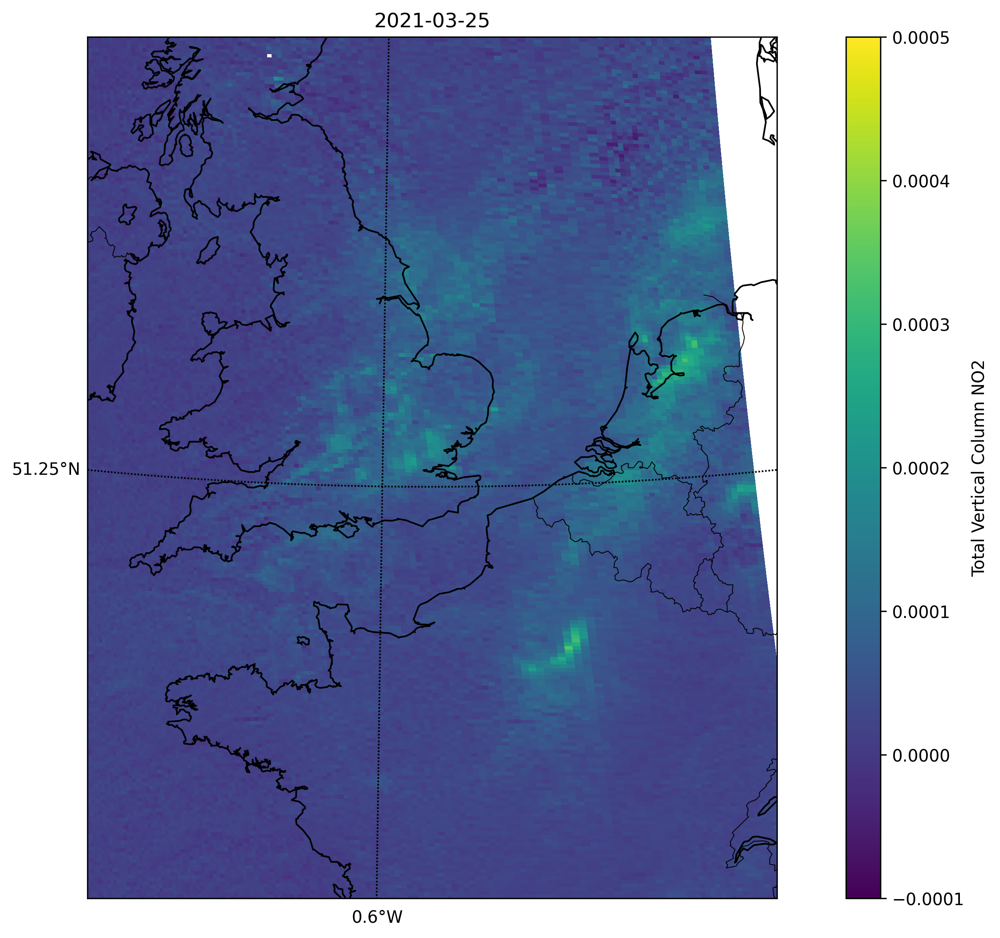

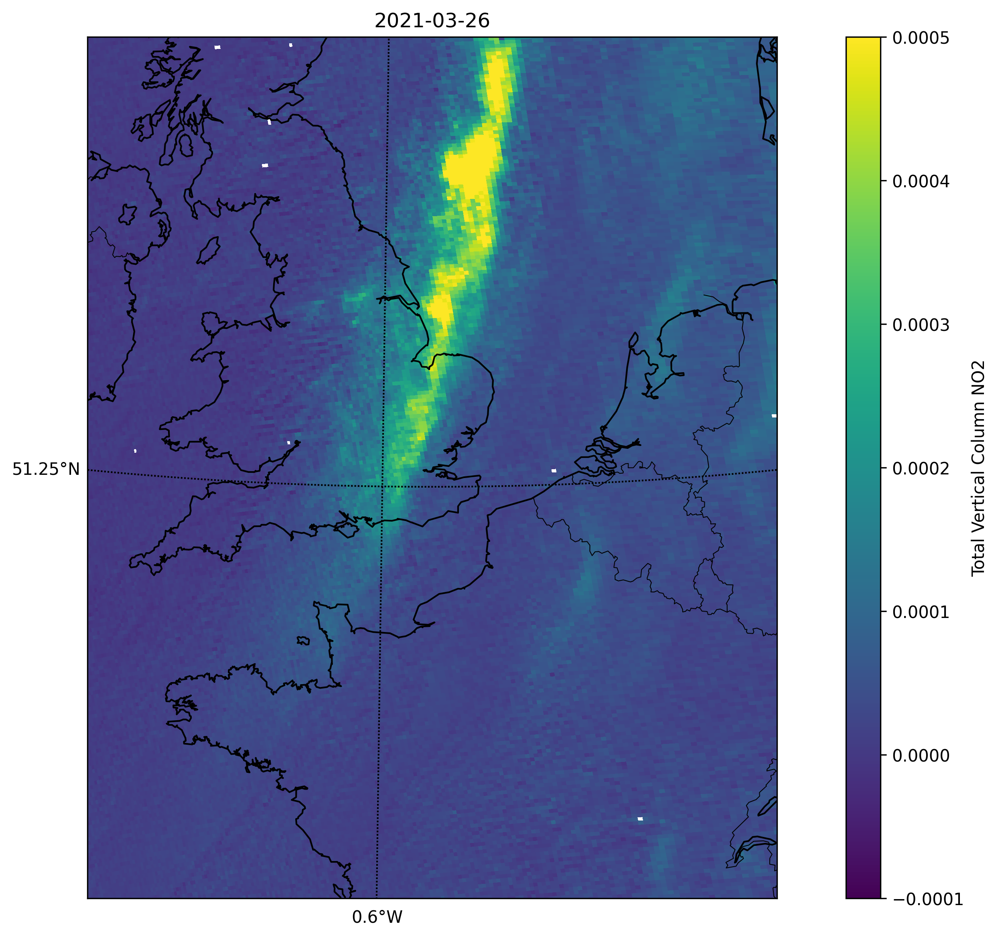

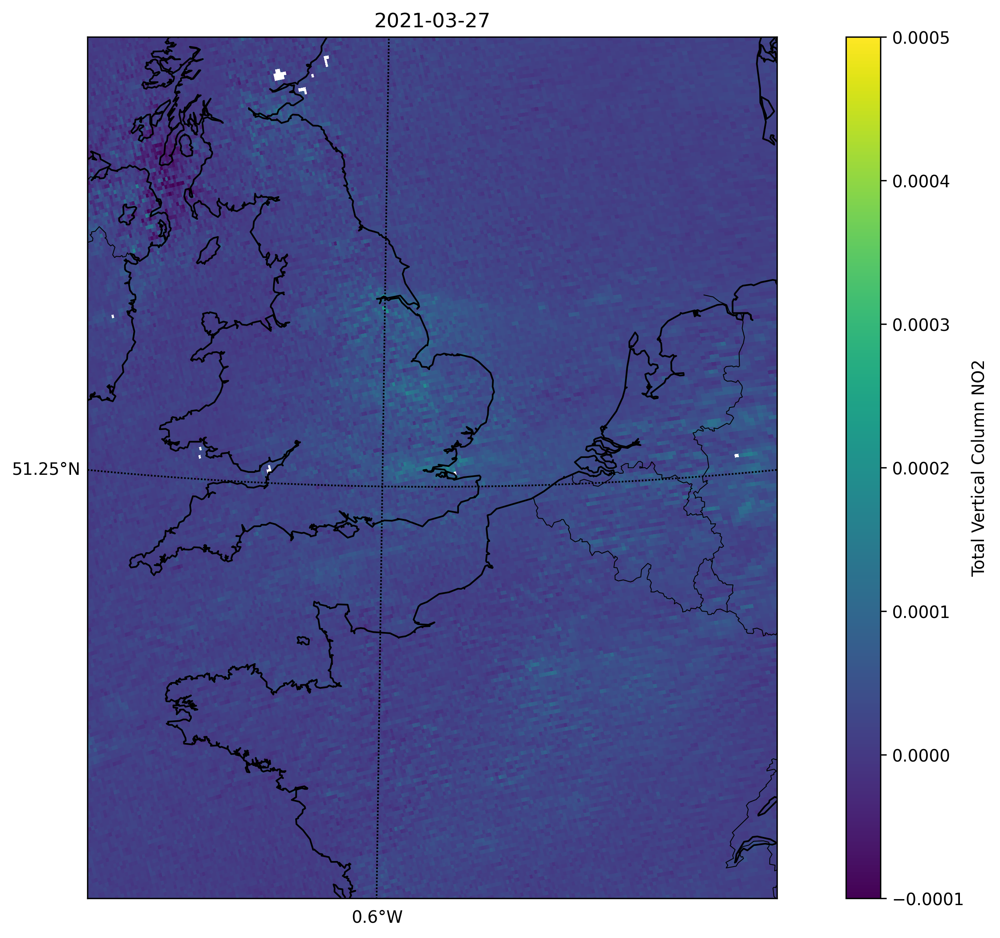

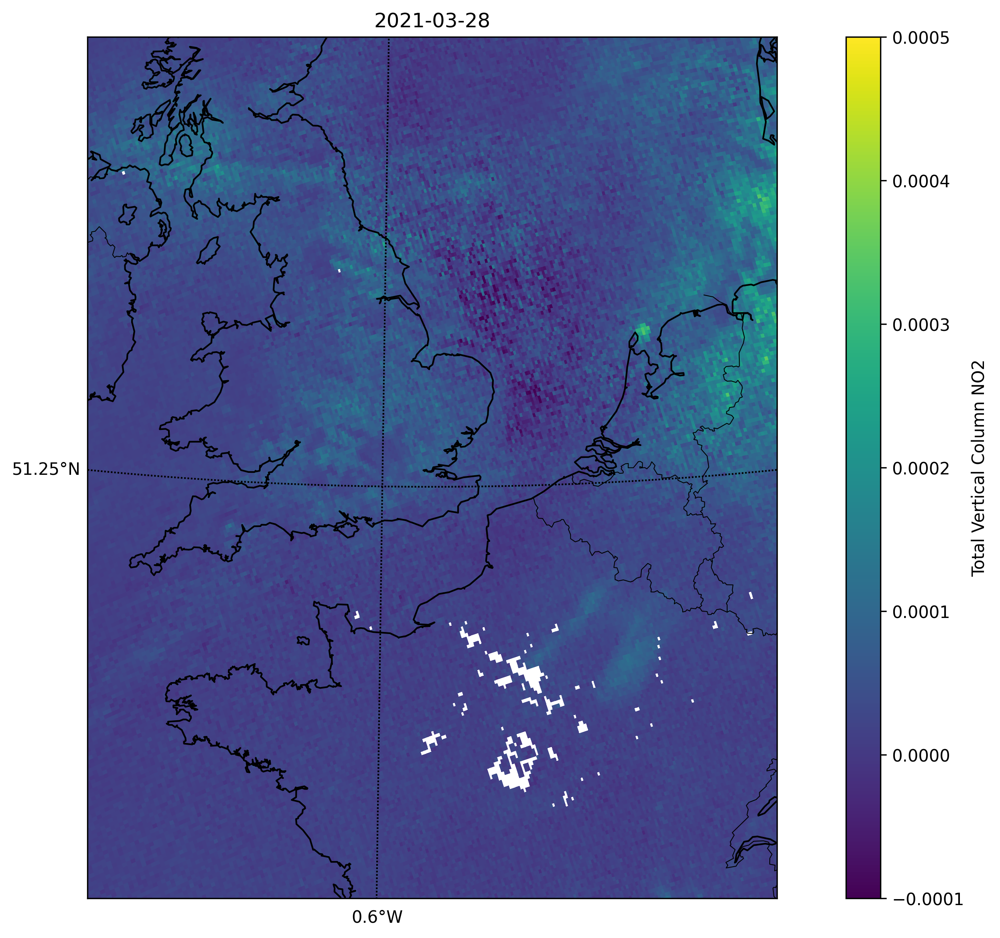

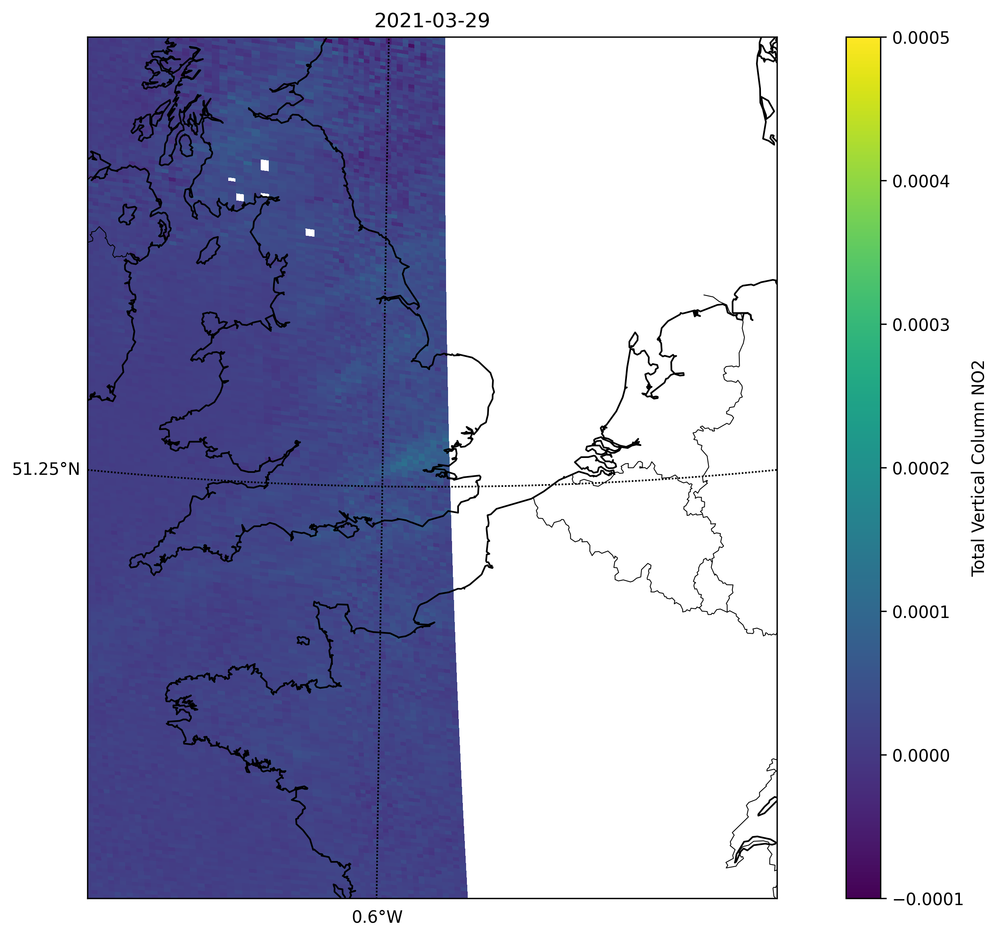

...

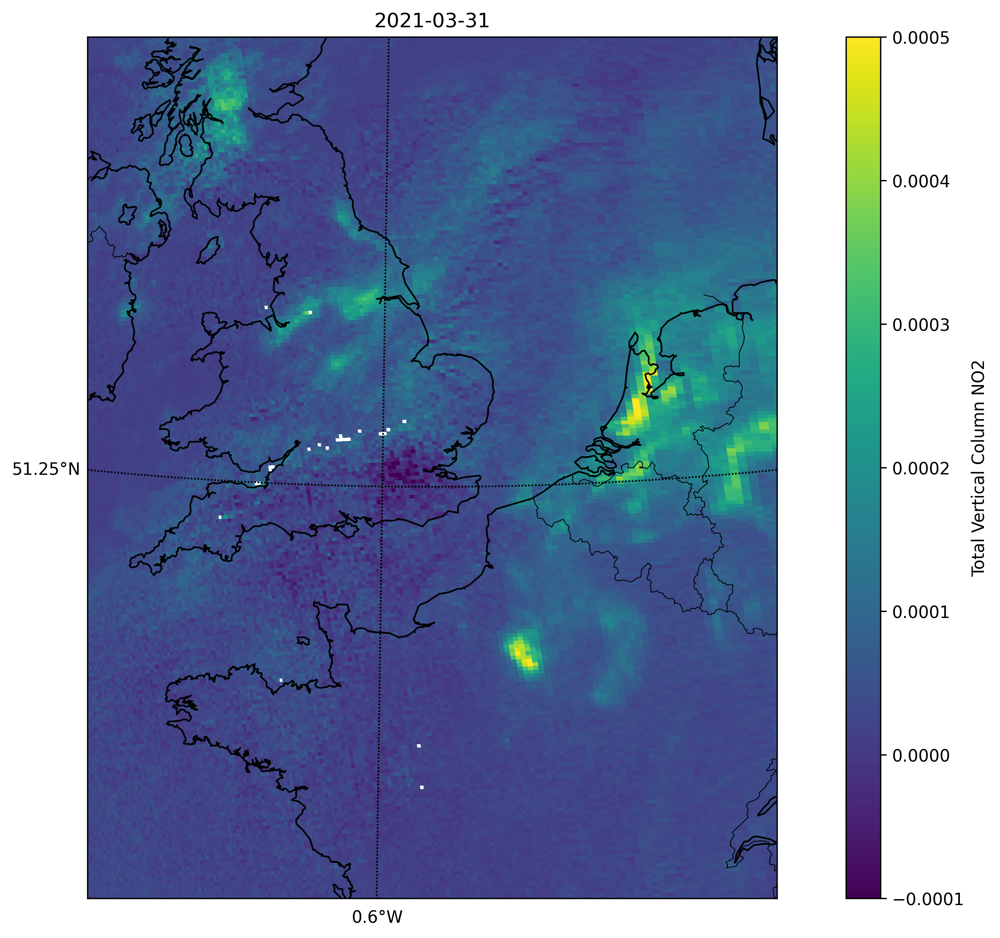

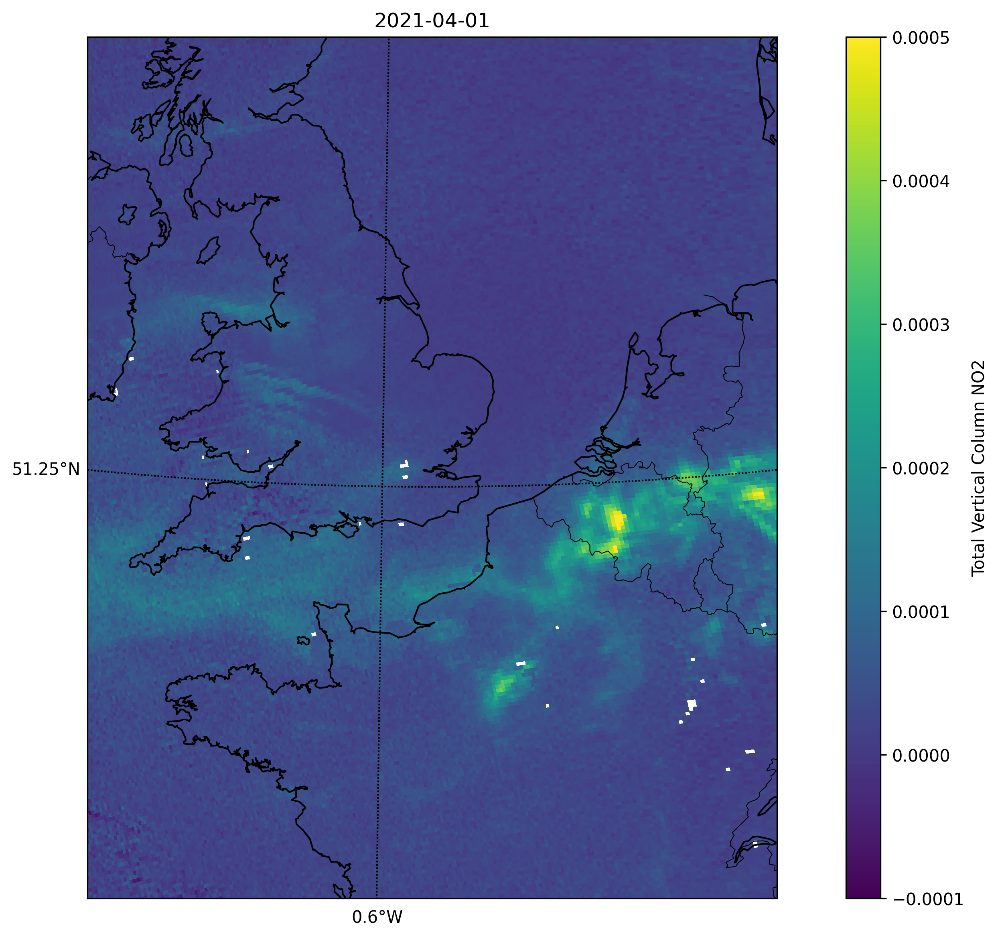

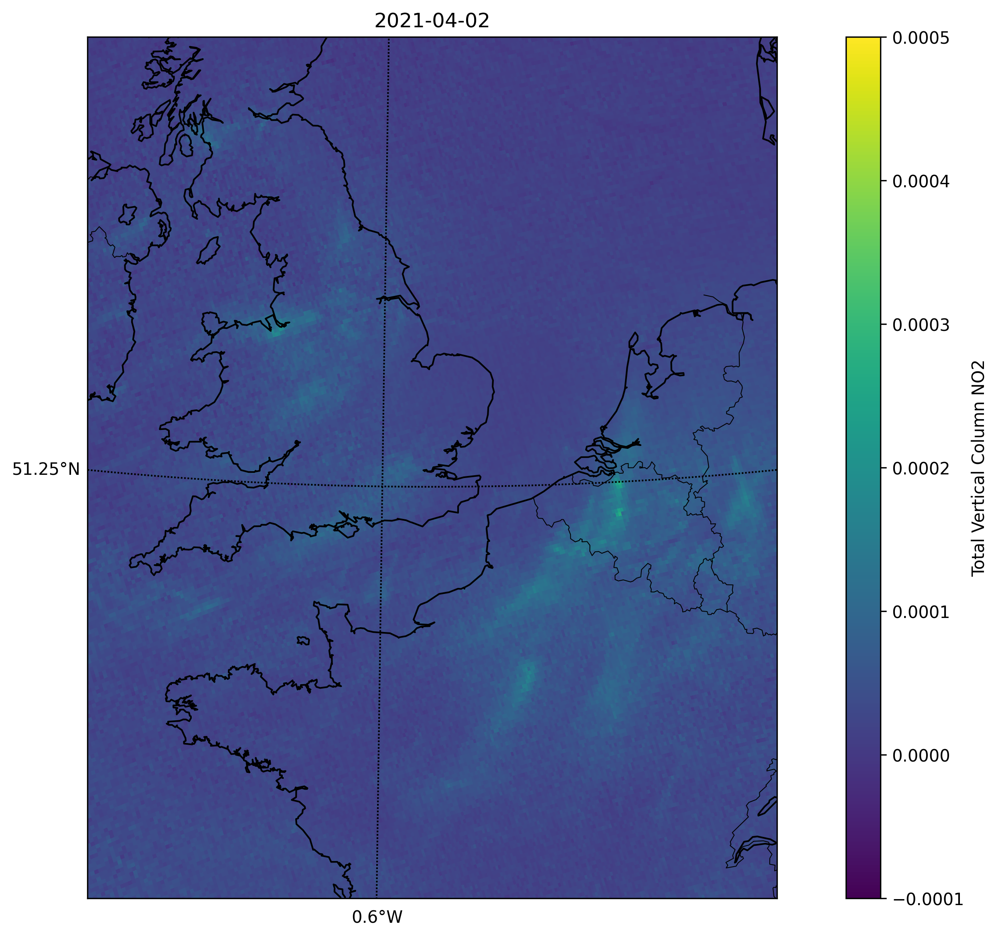

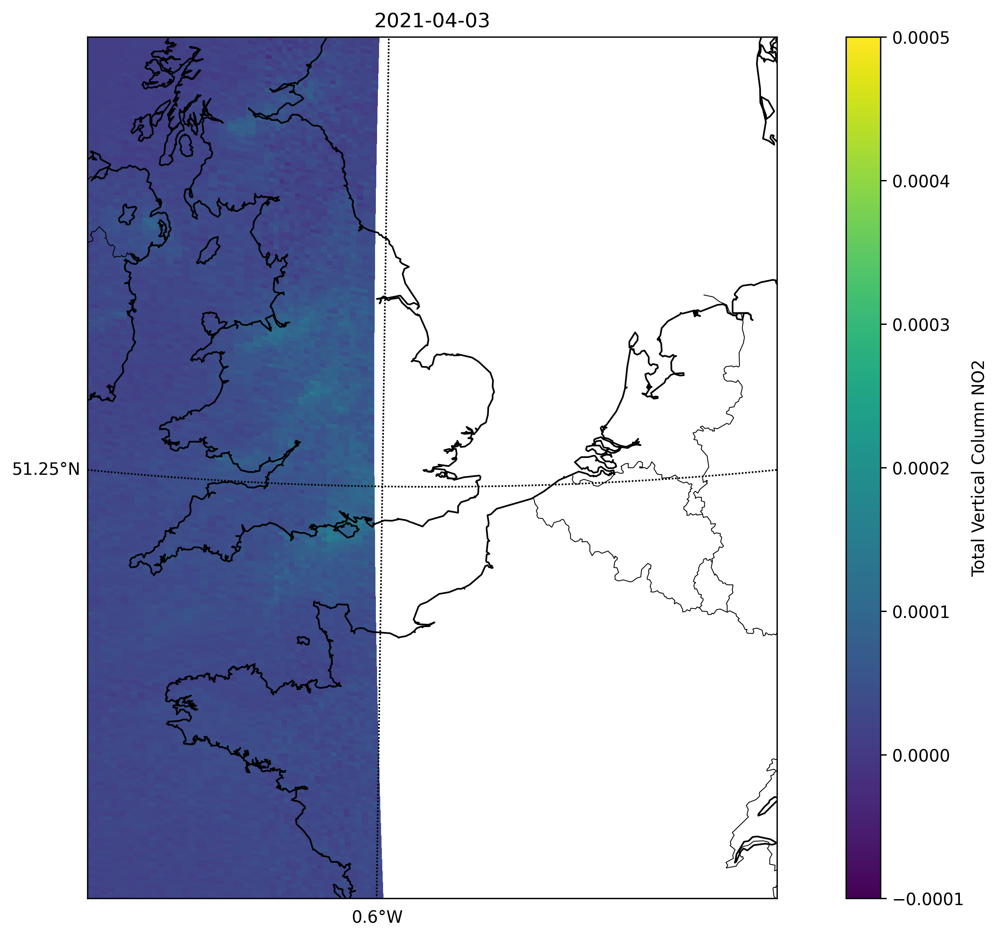

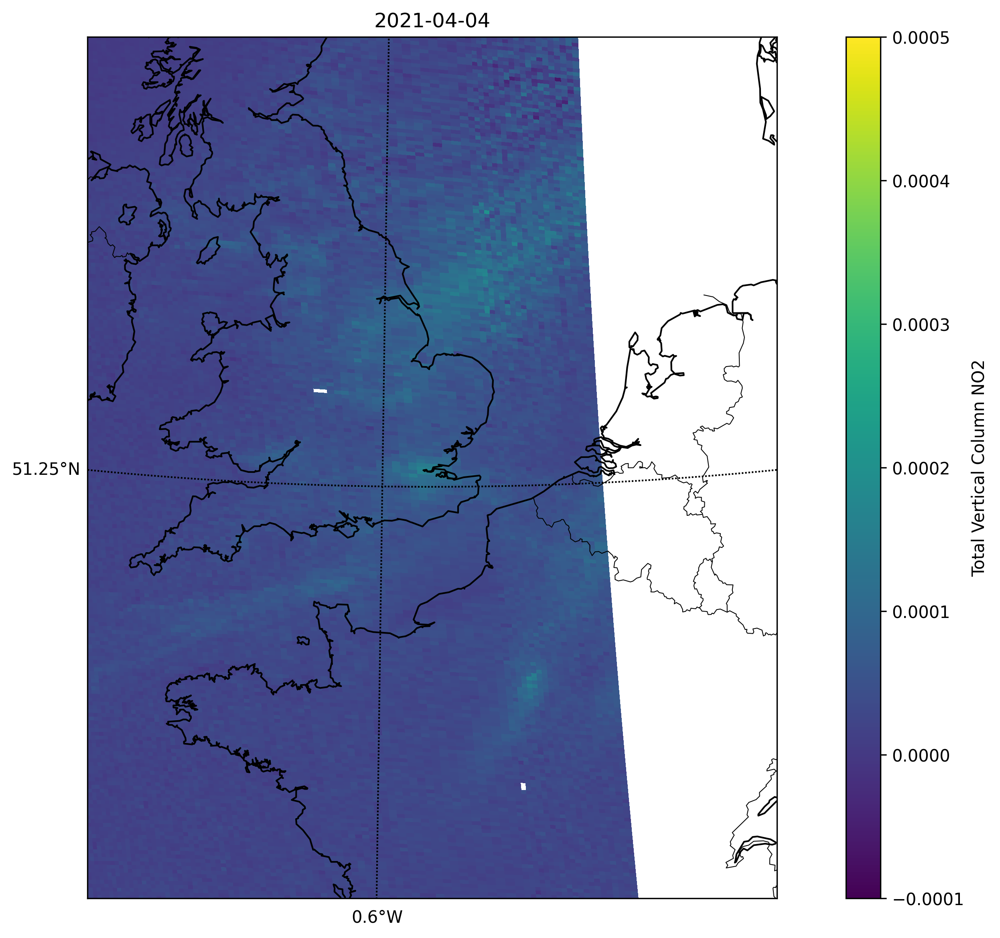

In [10]:
from IPython.display import Image, display



for imageName in listOfImageNames:
    display(Image(filename=imageName))